In [ ]:
!pip install torch torchvision torchaudio scenedetect

In [9]:
import cv2
import numpy as np
from scenedetect import VideoManager, SceneManager
from scenedetect.detectors import ContentDetector
import torch
from google.colab.patches import cv2_imshow

In [10]:
def select_frames_uniform_sampling(video_path, num_frames=20):
    """
    Selects frames using uniform sampling.
    """
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    interval = max(1, int(total_frames / num_frames))
    selected_frames = []
    count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if count % interval == 0:
            selected_frames.append(frame)
        count += 1
    cap.release()
    return selected_frames

In [11]:
def select_frames_scene_change_detection(video_path, num_frames=20):
    """
    Selects frames based on scene changes.
    """
    video_manager = VideoManager([video_path])
    scene_manager = SceneManager()
    scene_manager.add_detector(ContentDetector())
    video_manager.set_downscale_factor()
    video_manager.start()
    scene_manager.detect_scenes(frame_source=video_manager)
    scene_list = scene_manager.get_scene_list()
    selected_frames = []
    if len(scene_list) > num_frames:
        # If there are too many scenes, sample them uniformly
        interval = len(scene_list) // num_frames
        for i in range(0, len(scene_list) - 1, interval):
            scene = scene_list[i]
            cap = cv2.VideoCapture(video_path)
            cap.set(cv2.CAP_PROP_POS_FRAMES, scene[0].get_frames())
            ret, frame = cap.read()
            if ret:
                selected_frames.append(frame)
            cap.release()
    else:
        # Otherwise, take the first frame of each scene
        for scene in scene_list:
            cap = cv2.VideoCapture(video_path)
            cap.set(cv2.CAP_PROP_POS_FRAMES, scene[0].get_frames())
            ret, frame = cap.read()
            if ret:
                selected_frames.append(frame)
            cap.release()
    return selected_frames

In [12]:
def select_frames_motion_analysis(video_path, num_frames=20):
    """
    Selects frames with significant motion.
    """
    cap = cv2.VideoCapture(video_path)
    ret, prev_frame = cap.read()
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    selected_frames = [prev_frame]
    motion_magnitudes = []
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        magnitude, _ = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        motion_magnitudes.append(np.mean(magnitude))
        prev_gray = gray
    cap.release()
    # Select frames with top motion magnitudes
    indices = np.argsort(motion_magnitudes)[::-1]
    selected_indices = indices[:num_frames]
    selected_frames = []
    cap = cv2.VideoCapture(video_path)
    for i in selected_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if ret:
            selected_frames.append(frame)
    cap.release()
    return selected_frames

In [17]:
def detect_objects(frame, model, conf_thres=0.95):
    results = model(frame)
    detections = []
    for *xyxy, conf, cls in results.xyxy[0]:
        label = model.names[int(cls)]
        x_min, y_min, x_max, y_max = map(int, xyxy)
        detections.append((label, (x_min, y_min, x_max, y_max)))
    return detections

In [18]:
def visualize_detections(frame, detections):
    """
    Draws bounding boxes and labels on the frame.

    Args:
        frame: The input image frame.
        detections: A list of detected object labels and bounding boxes.
    """
    for label, (x_min, y_min, x_max, y_max) in detections:
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(frame, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

now i used all three methods one by one to see difference between them

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-2-3 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

100%|██████████| 166M/166M [00:01<00:00, 94.6MB/s]

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
Adding AutoShape... 
  with amp.autocast(autocast):



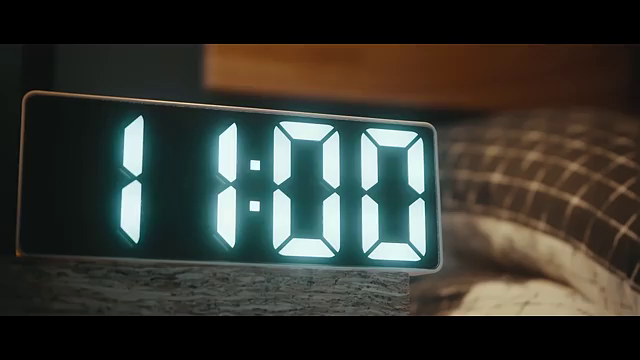

  with amp.autocast(autocast):



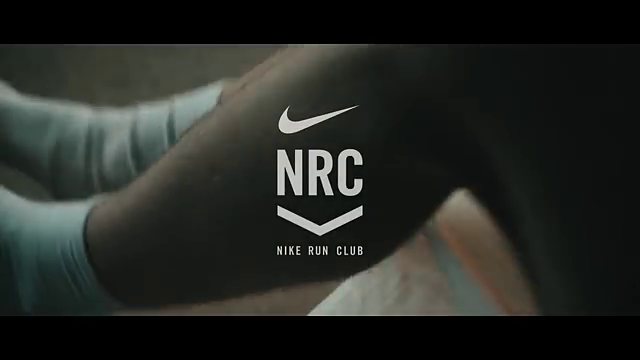

  with amp.autocast(autocast):



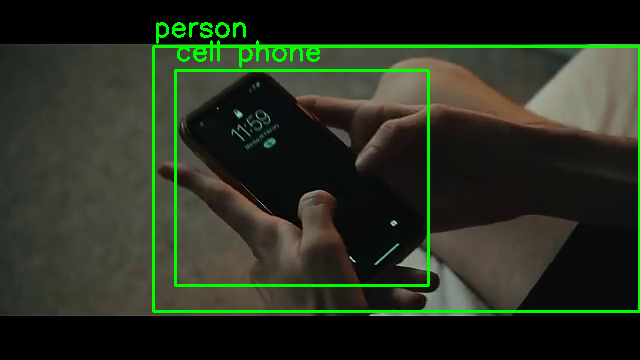

  with amp.autocast(autocast):



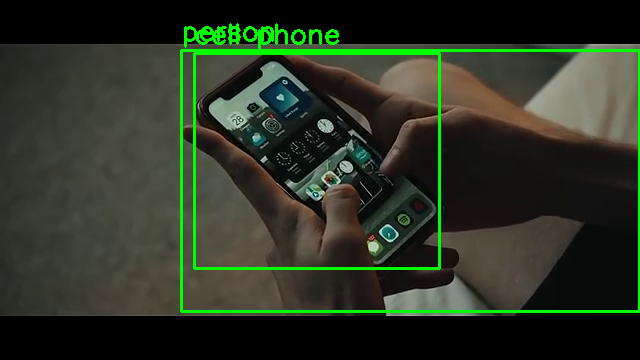

  with amp.autocast(autocast):



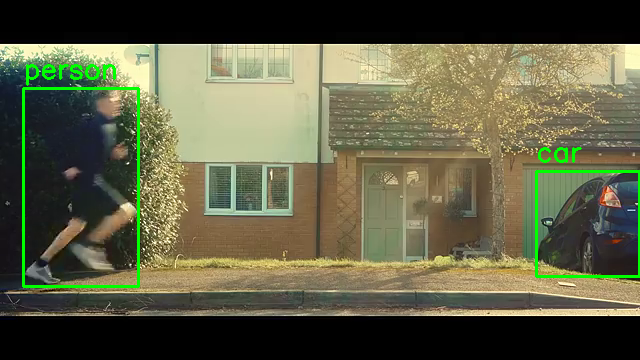

  with amp.autocast(autocast):



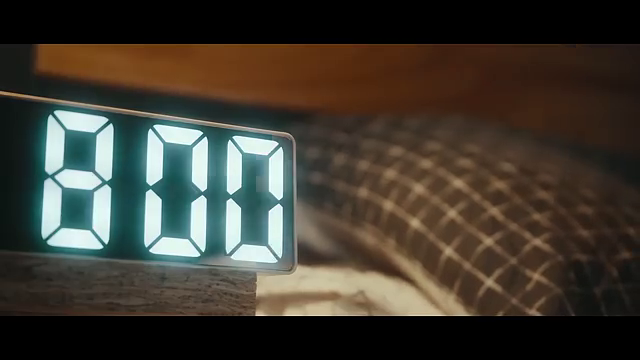

  with amp.autocast(autocast):



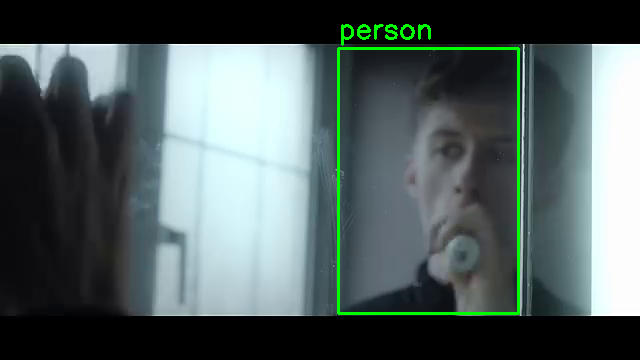

  with amp.autocast(autocast):



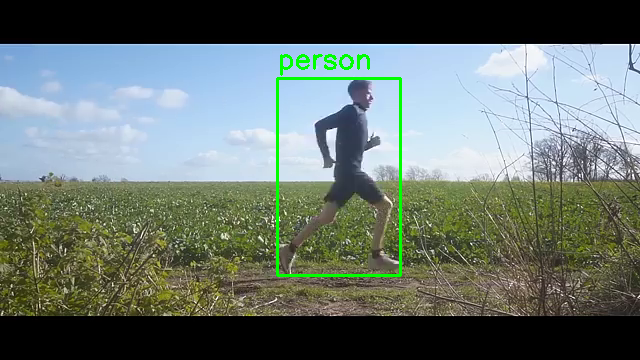

  with amp.autocast(autocast):



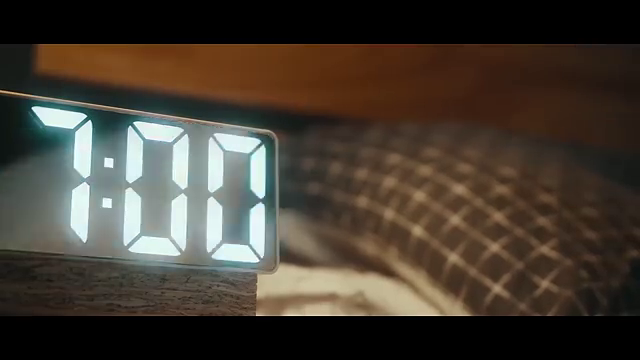

  with amp.autocast(autocast):



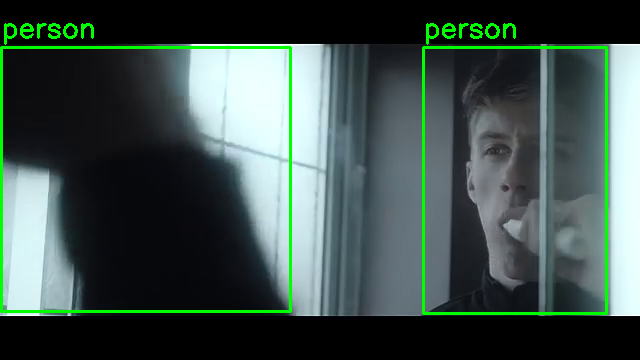

  with amp.autocast(autocast):



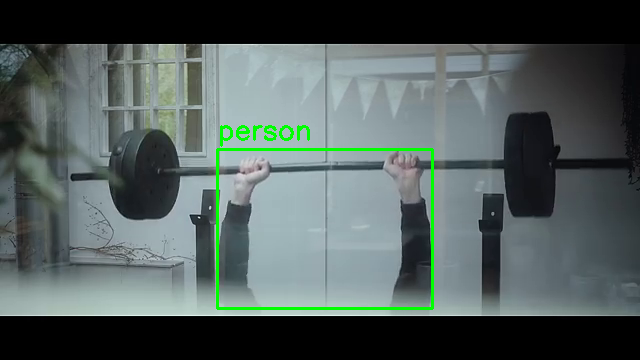

  with amp.autocast(autocast):



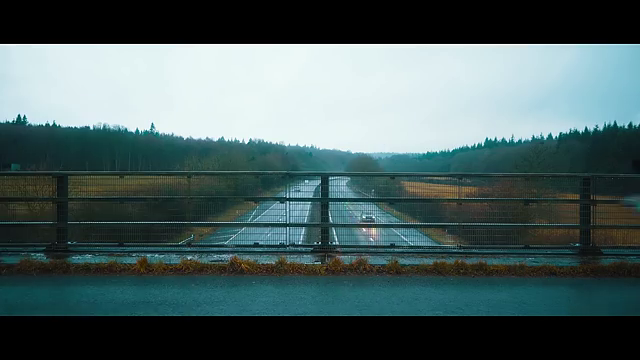

  with amp.autocast(autocast):



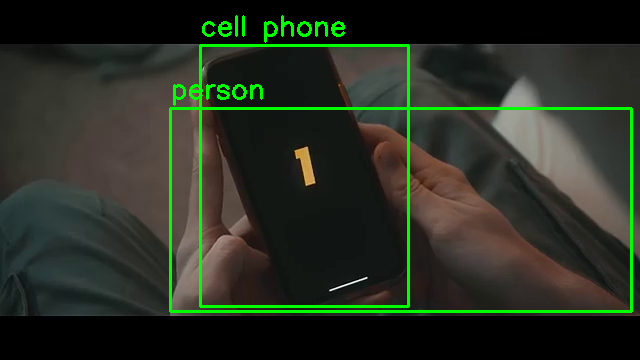

  with amp.autocast(autocast):



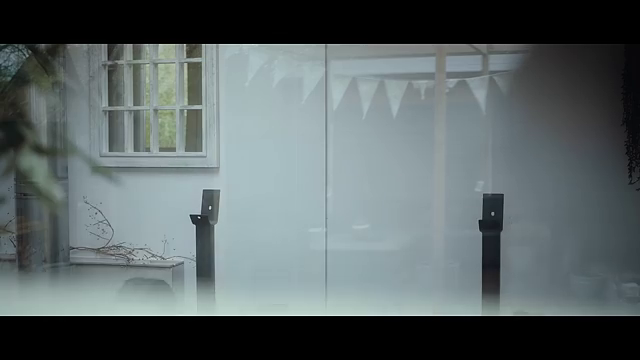

  with amp.autocast(autocast):



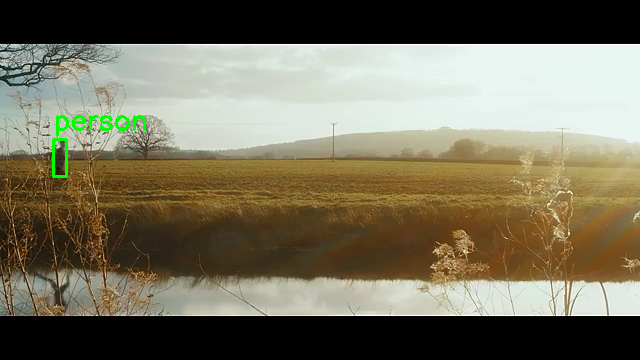

  with amp.autocast(autocast):



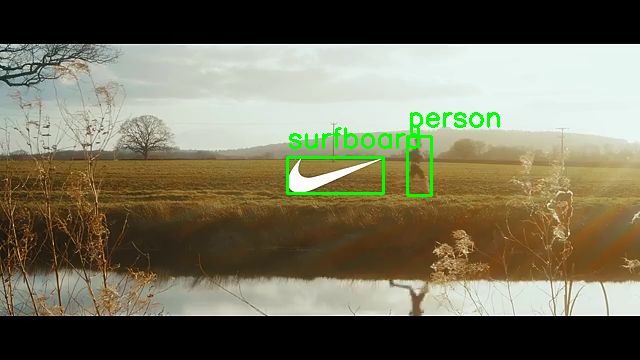

  with amp.autocast(autocast):



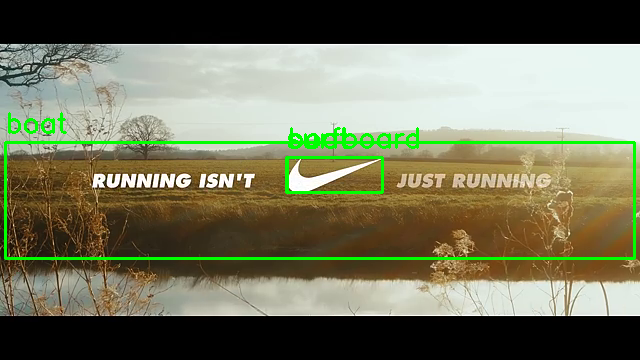

  with amp.autocast(autocast):



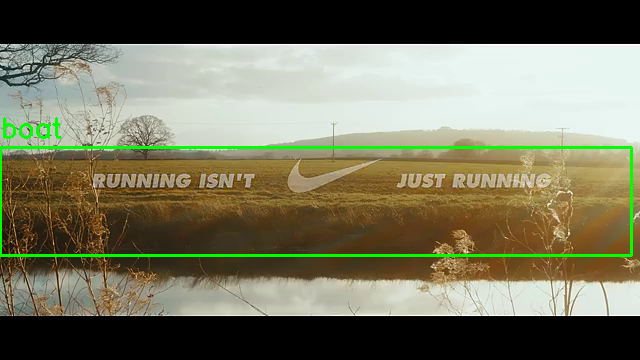

  with amp.autocast(autocast):



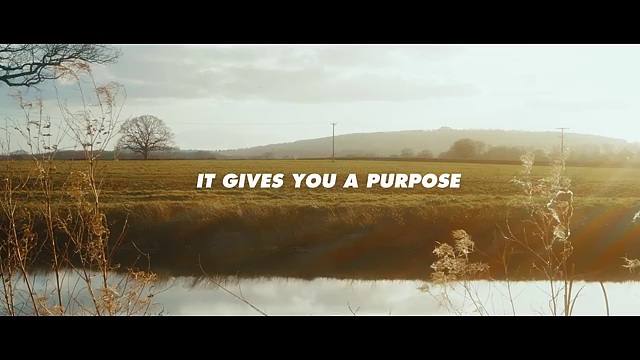

  with amp.autocast(autocast):



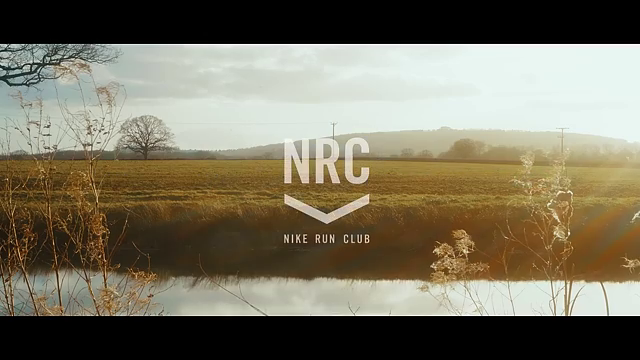

  with amp.autocast(autocast):



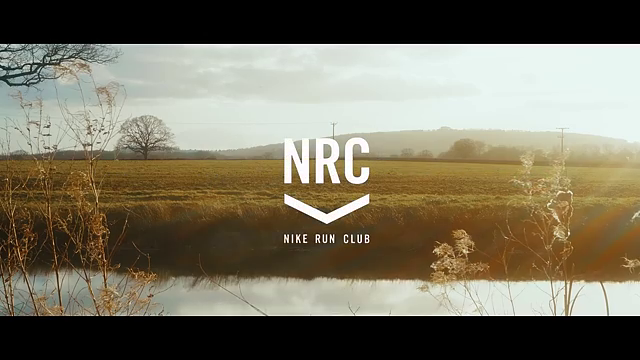

In [19]:
if __name__ == "__main__":
    video_path = '/content/Nike.mp4'  # Replace with your video path

    # Load the YOLOv5 model
    model = torch.hub.load('ultralytics/yolov5', 'yolov5x', source='github')

    selected_frames = select_frames_uniform_sampling(video_path)

    # Perform object detection on selected frames
    for frame in selected_frames:
        detections = detect_objects(frame, model)
        visualize_detections(frame, detections)
        cv2_imshow(frame)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-2-3 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
Adding AutoShape... 
ERROR:pyscenedetect:VideoManager is deprecated and will be removed.
INFO:pyscenedetect:Loaded 1 video, framerate: 23.976 FPS, resolution: 640 x 360
INFO:pyscenedetect:Detecting scenes...
  with amp.autocast(autocast):



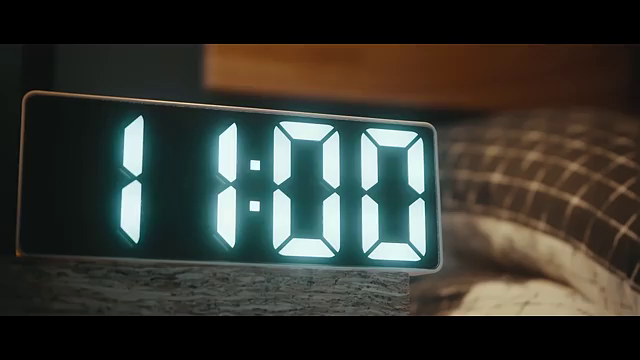

  with amp.autocast(autocast):



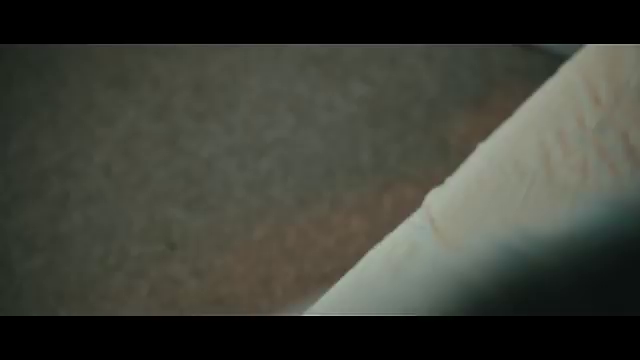

  with amp.autocast(autocast):



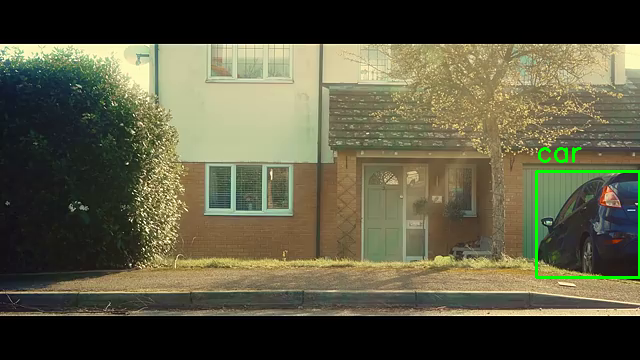

  with amp.autocast(autocast):



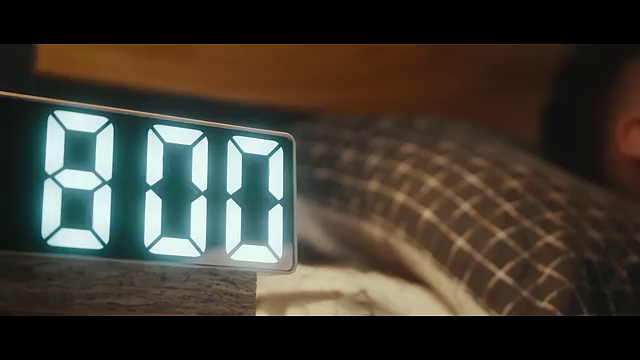

  with amp.autocast(autocast):



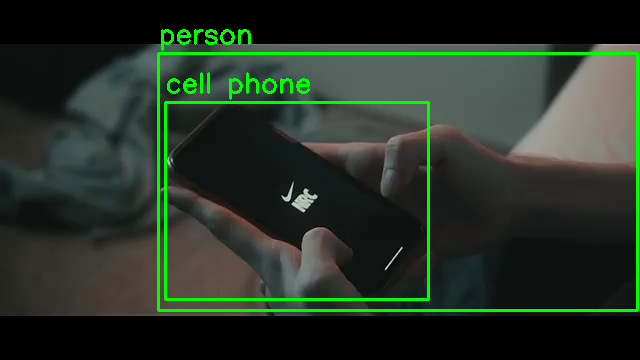

  with amp.autocast(autocast):



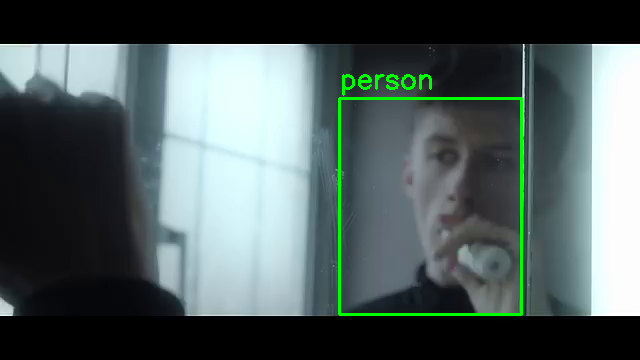

  with amp.autocast(autocast):



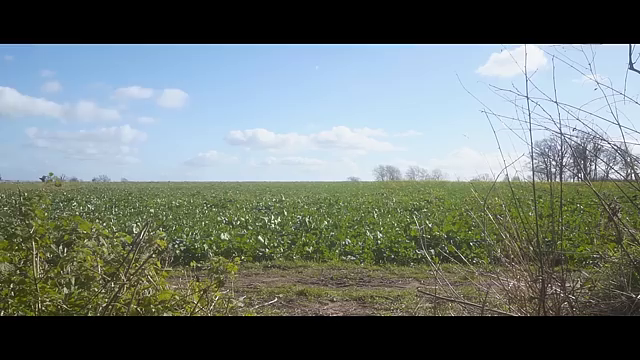

  with amp.autocast(autocast):



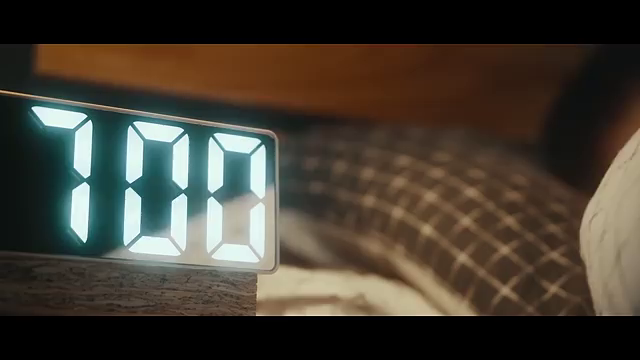

  with amp.autocast(autocast):



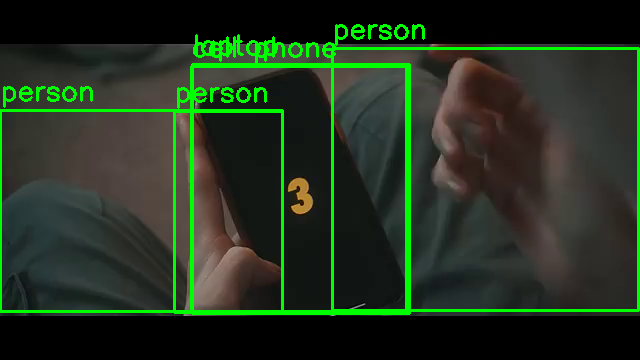

  with amp.autocast(autocast):



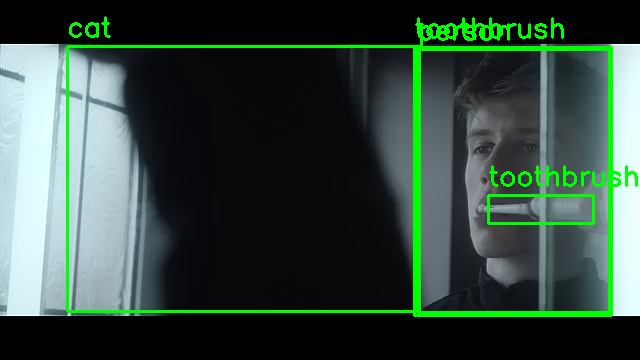

  with amp.autocast(autocast):



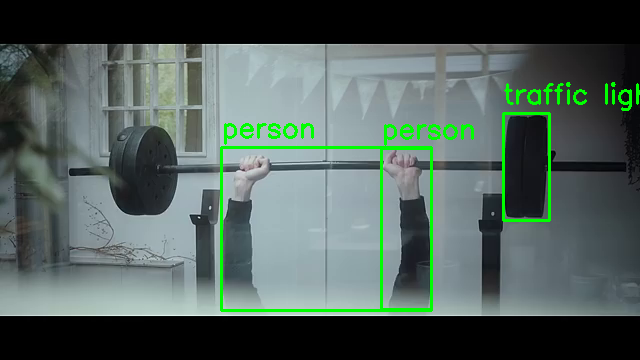

  with amp.autocast(autocast):



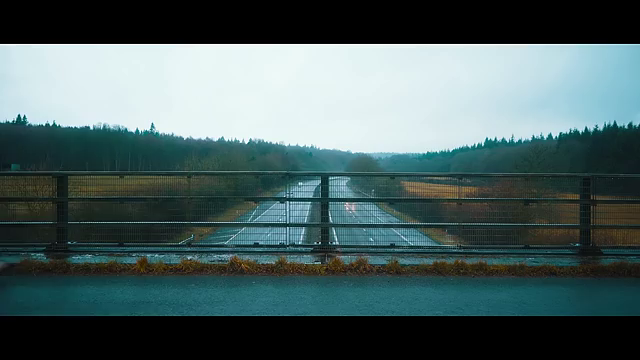

  with amp.autocast(autocast):



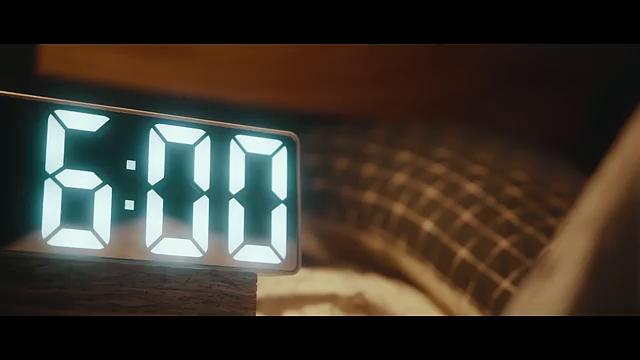

  with amp.autocast(autocast):



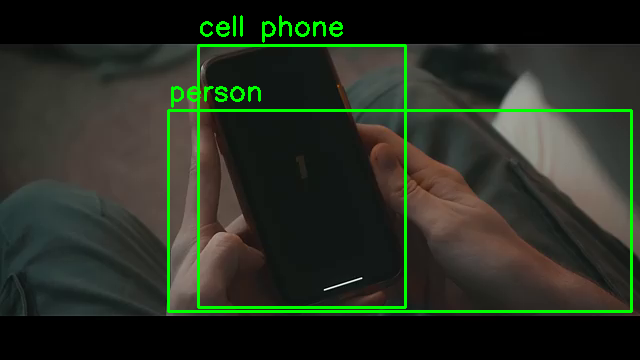

  with amp.autocast(autocast):



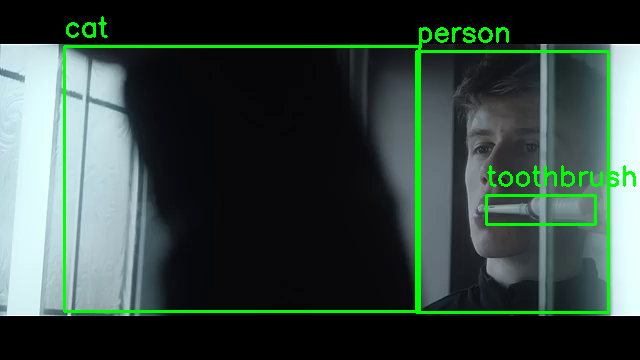

  with amp.autocast(autocast):



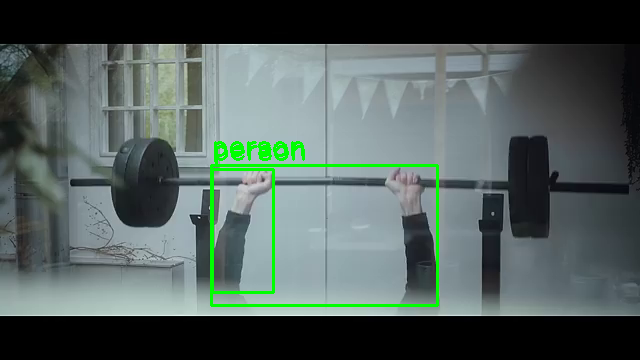

  with amp.autocast(autocast):



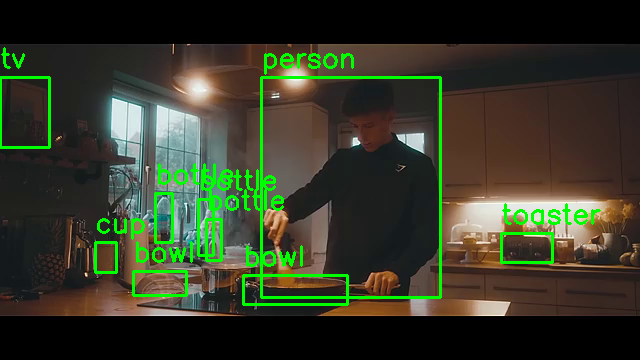

  with amp.autocast(autocast):



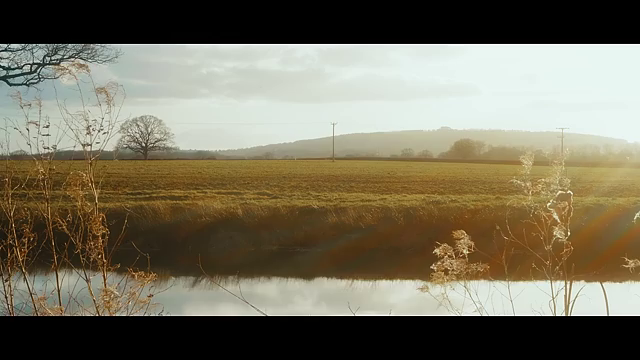

  with amp.autocast(autocast):



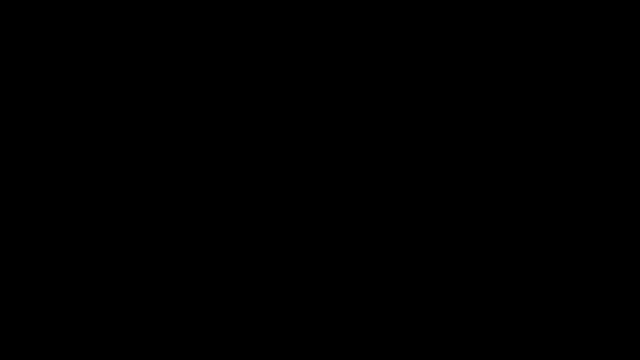

In [21]:
if __name__ == "__main__":
    video_path = '/content/Nike.mp4'  # Replace with your video path

    # Load the YOLOv5 model
    model = torch.hub.load('ultralytics/yolov5', 'yolov5x', source='github')


    selected_frames = select_frames_scene_change_detection(video_path)

    # Perform object detection on selected frames
    for frame in selected_frames:
        detections = detect_objects(frame, model)
        visualize_detections(frame, detections)
        cv2_imshow(frame)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-2-3 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
Adding AutoShape... 
  with amp.autocast(autocast):



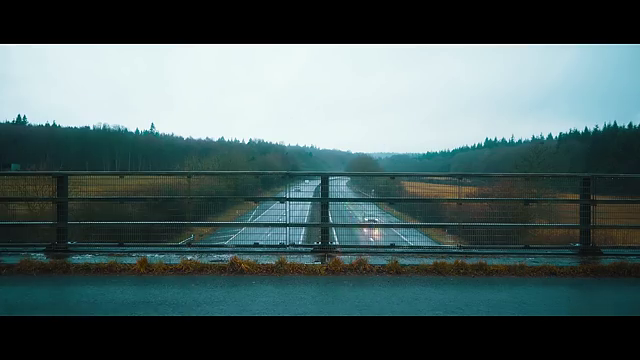

  with amp.autocast(autocast):



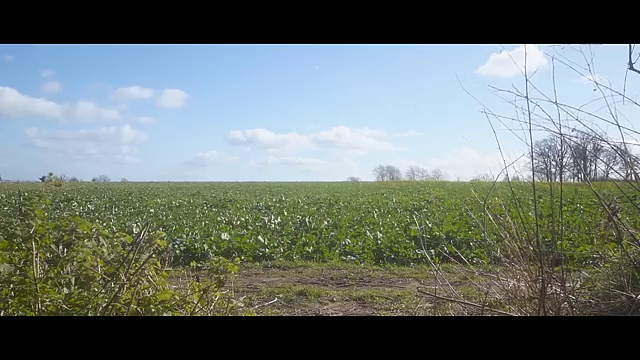

  with amp.autocast(autocast):



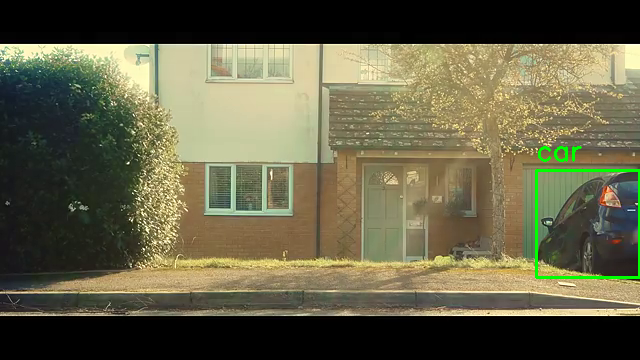

  with amp.autocast(autocast):



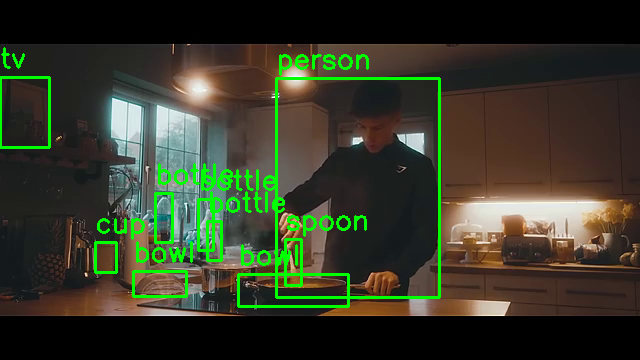

  with amp.autocast(autocast):



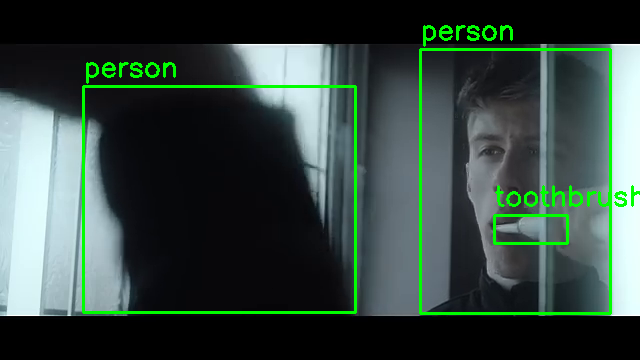

  with amp.autocast(autocast):



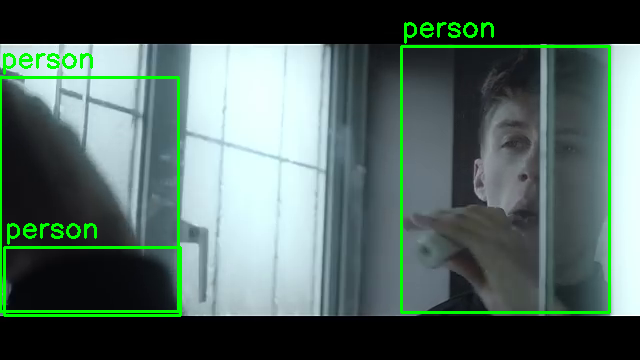

  with amp.autocast(autocast):



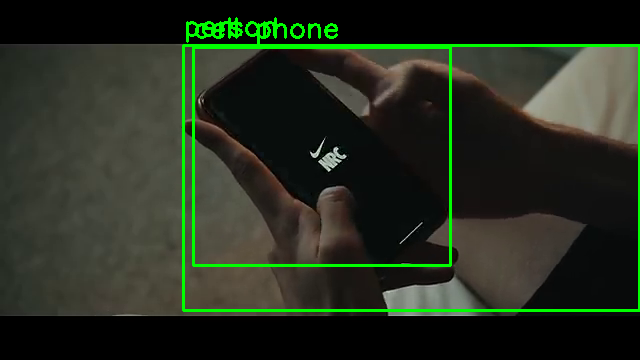

  with amp.autocast(autocast):



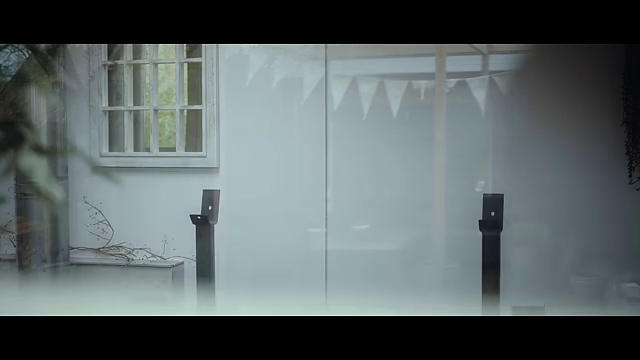

  with amp.autocast(autocast):



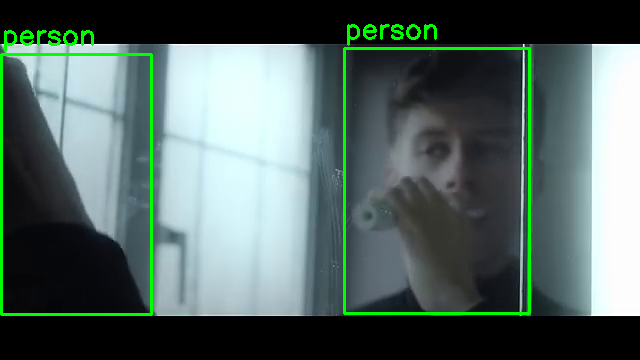

  with amp.autocast(autocast):



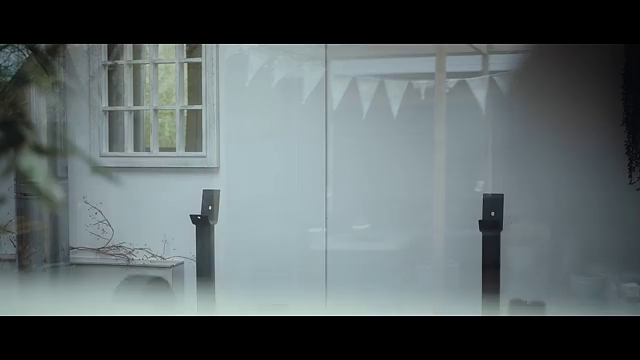

  with amp.autocast(autocast):



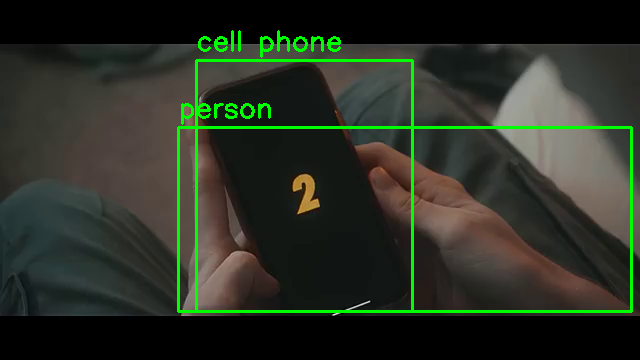

  with amp.autocast(autocast):



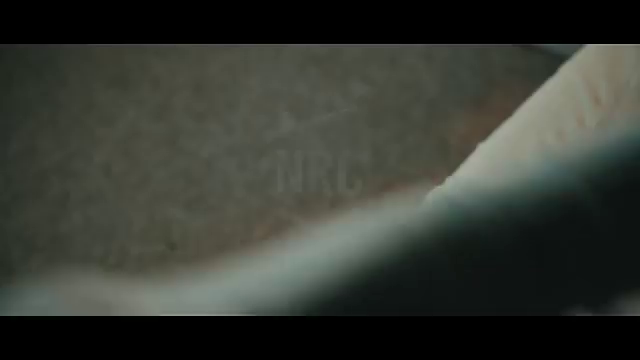

  with amp.autocast(autocast):



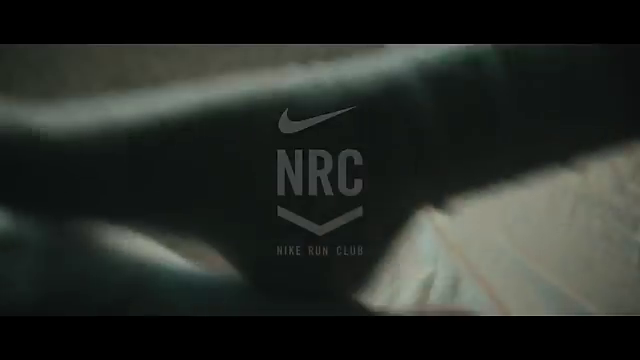

  with amp.autocast(autocast):



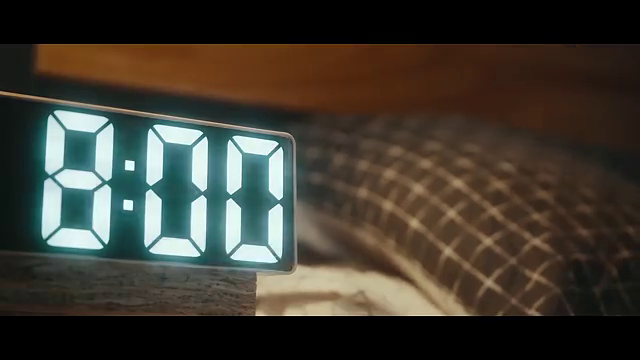

  with amp.autocast(autocast):



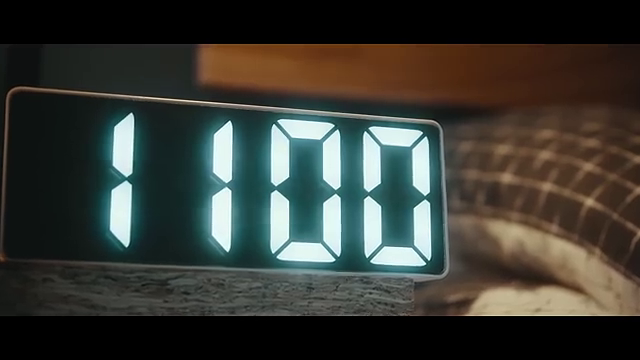

  with amp.autocast(autocast):



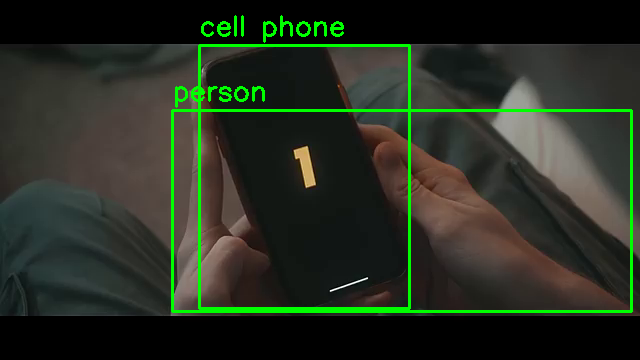

  with amp.autocast(autocast):



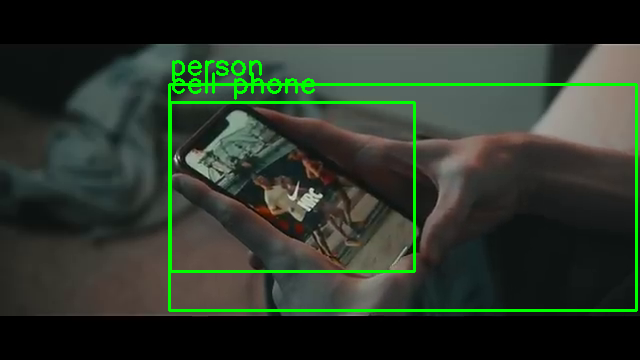

  with amp.autocast(autocast):



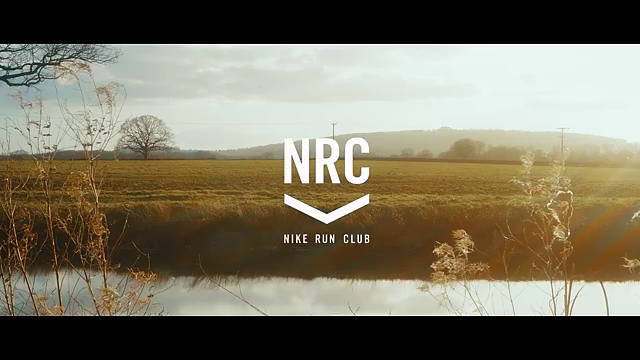

  with amp.autocast(autocast):



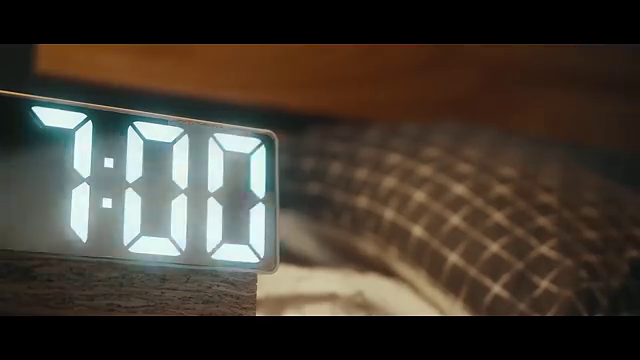

  with amp.autocast(autocast):



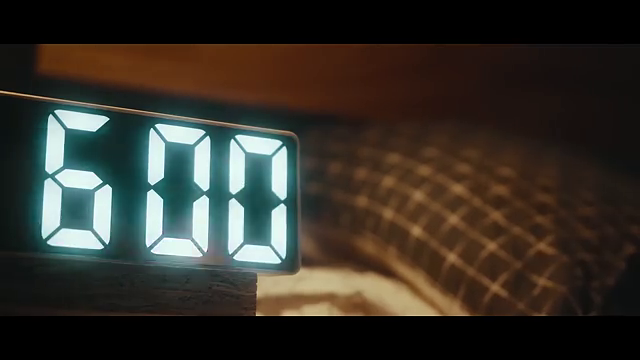

In [22]:
if __name__ == "__main__":
    video_path = '/content/Nike.mp4'  # Replace with your video path

    # Load the YOLOv5 model
    model = torch.hub.load('ultralytics/yolov5', 'yolov5x', source='github')

    selected_frames = select_frames_motion_analysis(video_path)

    # Perform object detection on selected frames
    for frame in selected_frames:
        detections = detect_objects(frame, model)
        visualize_detections(frame, detections)
        cv2_imshow(frame)
